Carga las imágenes de los años 2000 al 2019


Saving images-0000.jpg to images-0000 (7).jpg
Saving images-0001.jpg to images-0001 (7).jpg
Saving images-0002.jpg to images-0002 (7).jpg
Saving images-0003.jpg to images-0003 (7).jpg
Saving images-0004.jpg to images-0004 (7).jpg
Saving images-0005.jpg to images-0005 (7).jpg
Saving images-0006.jpg to images-0006 (7).jpg
Saving images-0007.jpg to images-0007 (7).jpg
Saving images-0008.jpg to images-0008 (7).jpg
Saving images-0009.jpg to images-0009 (7).jpg
Saving images-0010.jpg to images-0010 (7).jpg
Saving images-0011.jpg to images-0011 (7).jpg
Saving images-0012.jpg to images-0012 (7).jpg
Saving images-0013.jpg to images-0013 (7).jpg
Saving images-0014.jpg to images-0014 (7).jpg
Saving images-0015.jpg to images-0015 (7).jpg
Saving images-0016.jpg to images-0016 (7).jpg
Saving images-0017.jpg to images-0017 (7).jpg
Saving images-0018.jpg to images-0018 (7).jpg
Saving images-0019.jpg to images-0019 (7).jpg
Procesando imagen del año 2000: images-0000 (7).jpg


<ipython-input-8-04a99f4af7c6>:43: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 300 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)
will give the desired result (the cast overflows).
  lower_cloud = np.array([0, 0, 300], dtype=np.uint8)
<ipython-input-8-04a99f4af7c6>:54: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  mascara_nubes = closing(mascara_nubes, square(7))
<ipython-input-8-04a99f4af7c6>:55: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  mascara_nubes = opening(mascara_nubes, square(5))
<ipython-input-8-04a99f4af7c6>:59: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprin

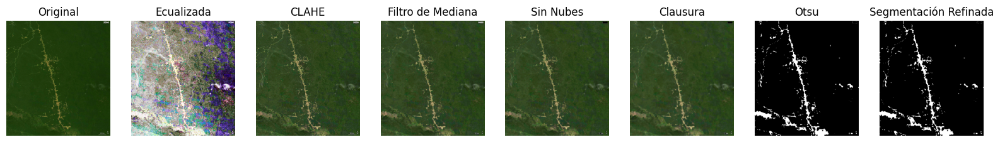

Procesando imagen del año 2001: images-0001 (7).jpg


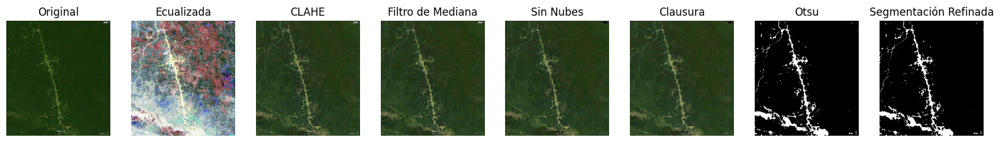

Procesando imagen del año 2002: images-0002 (7).jpg


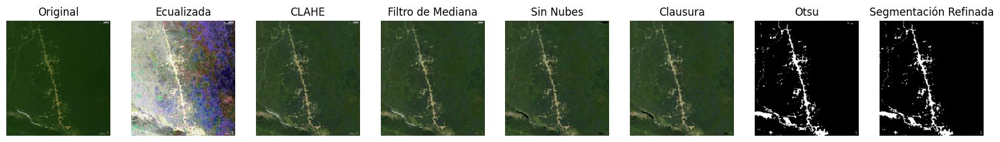

Procesando imagen del año 2003: images-0003 (7).jpg


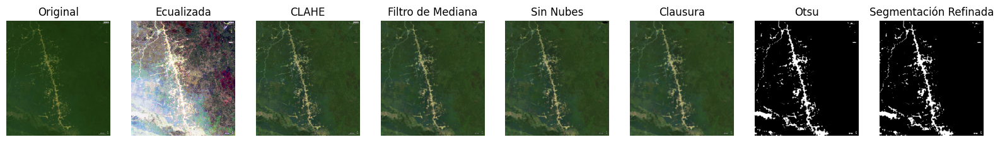

Procesando imagen del año 2004: images-0004 (7).jpg


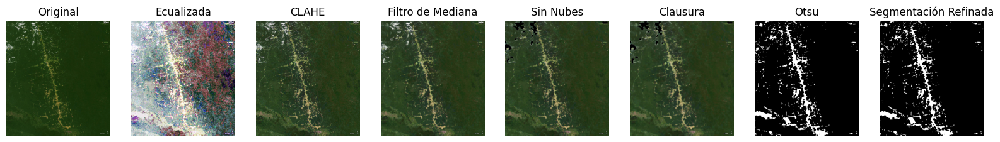

Procesando imagen del año 2005: images-0005 (7).jpg


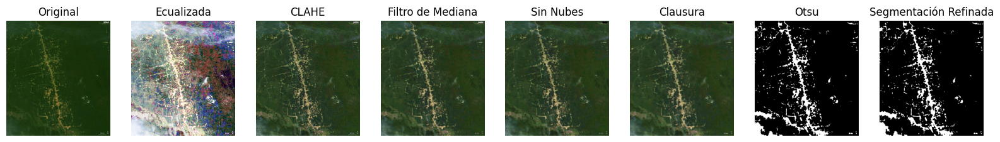

Procesando imagen del año 2006: images-0006 (7).jpg


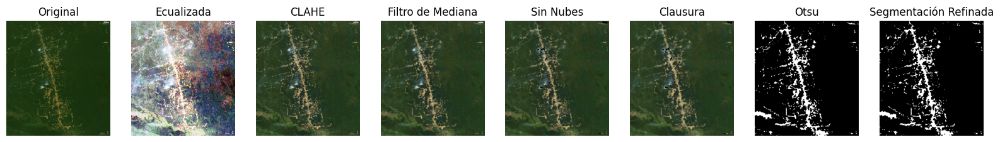

Procesando imagen del año 2007: images-0007 (7).jpg


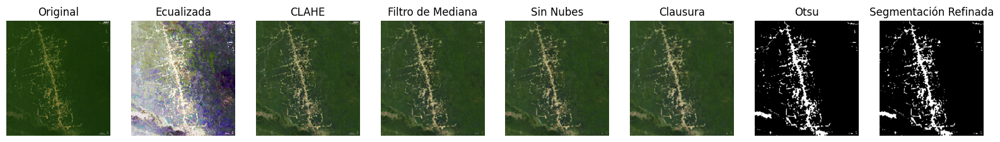

Procesando imagen del año 2008: images-0008 (7).jpg


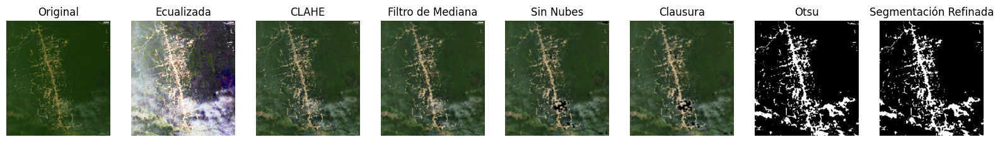

Procesando imagen del año 2009: images-0009 (7).jpg


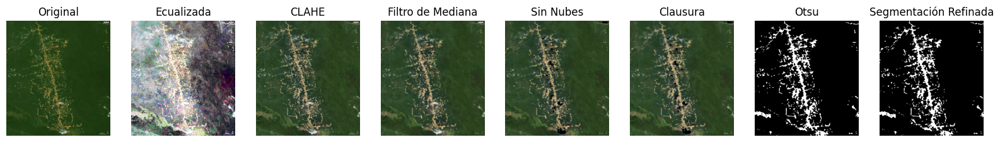

Procesando imagen del año 2010: images-0010 (7).jpg


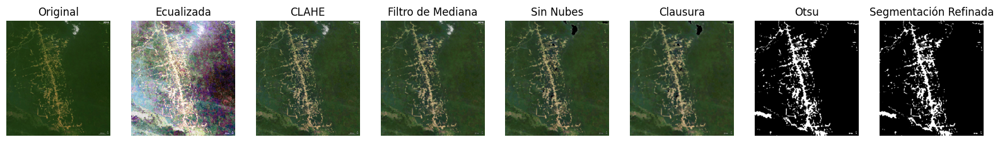

Procesando imagen del año 2011: images-0011 (7).jpg


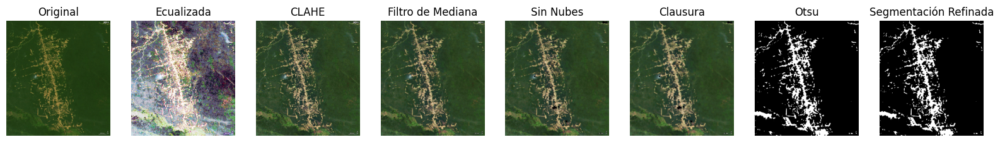

Procesando imagen del año 2012: images-0012 (7).jpg


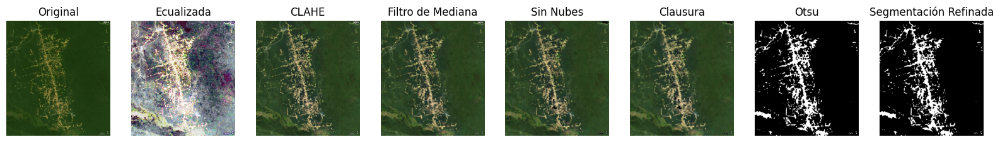

Procesando imagen del año 2013: images-0013 (7).jpg


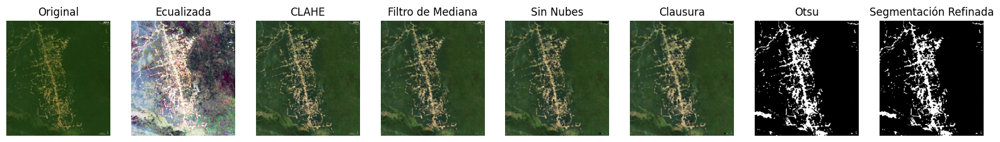

Procesando imagen del año 2014: images-0014 (7).jpg


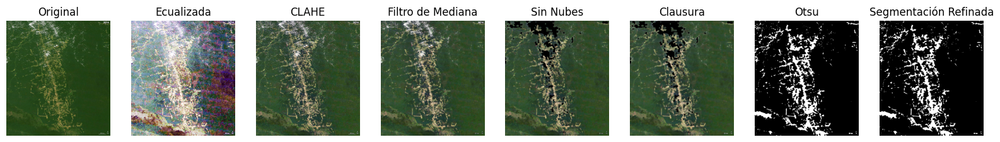

Procesando imagen del año 2015: images-0015 (7).jpg


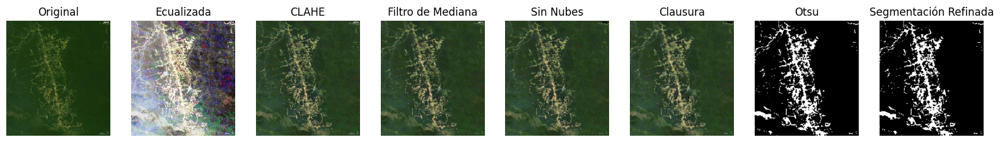

Procesando imagen del año 2016: images-0016 (7).jpg


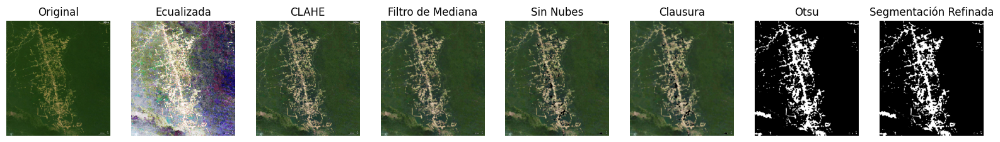

Procesando imagen del año 2017: images-0017 (7).jpg


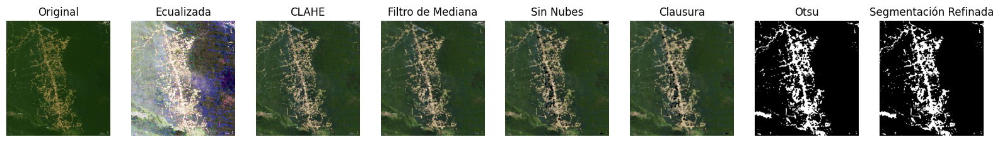

Procesando imagen del año 2018: images-0018 (7).jpg


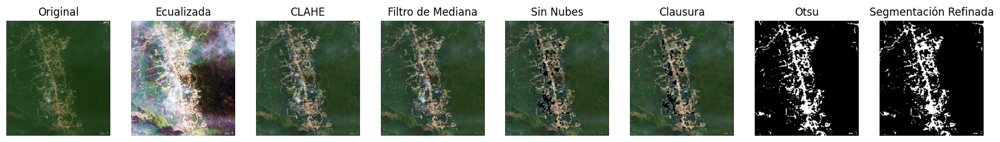

Procesando imagen del año 2019: images-0019 (7).jpg


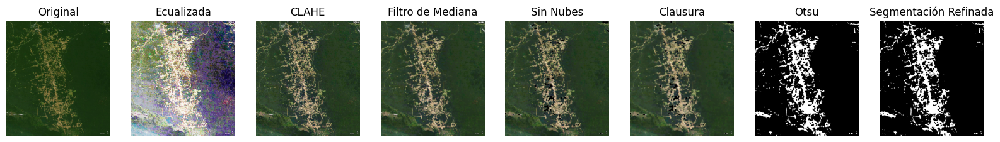

Año 2000: Área deforestada estimada = 4739.10 km²
Año 2001: Área deforestada estimada = 5922.49 km²
Año 2002: Área deforestada estimada = 5270.13 km²
Año 2003: Área deforestada estimada = 5888.20 km²
Año 2004: Área deforestada estimada = 7460.82 km²
Año 2005: Área deforestada estimada = 8835.22 km²
Año 2006: Área deforestada estimada = 8062.90 km²
Año 2007: Área deforestada estimada = 7620.45 km²
Año 2008: Área deforestada estimada = 12103.96 km²
Año 2009: Área deforestada estimada = 8907.50 km²
Año 2010: Área deforestada estimada = 8893.66 km²
Año 2011: Área deforestada estimada = 10523.49 km²
Año 2012: Área deforestada estimada = 10286.20 km²
Año 2013: Área deforestada estimada = 10703.27 km²
Año 2014: Área deforestada estimada = 10765.86 km²
Año 2015: Área deforestada estimada = 11260.13 km²
Año 2016: Área deforestada estimada = 11164.48 km²
Año 2017: Área deforestada estimada = 11916.34 km²
Año 2018: Área deforestada estimada = 10435.52 km²
Año 2019: Área deforestada estimada = 123

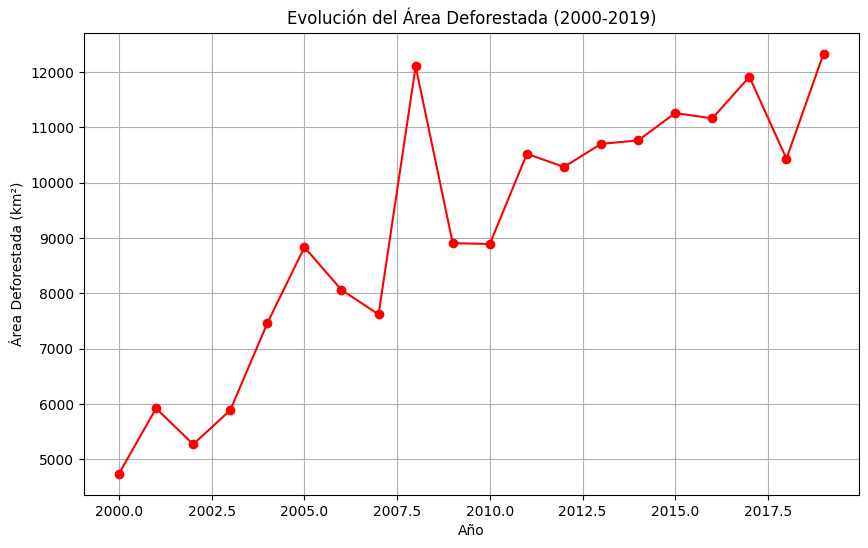

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import closing, opening, square
from google.colab import files

def mostrar_procesamiento(imagenes, titulos):
    plt.figure(figsize=(20, 4))
    for i, (img, title) in enumerate(zip(imagenes, titulos)):
        plt.subplot(1, len(imagenes), i + 1)
        plt.imshow(img)
        plt.title(title)
        plt.axis('off')
    plt.show()

print("Carga las imágenes de los años 2000 al 2019")
imagenes_subidas = files.upload()

km_por_pixel = 20 / 51
resultados = {}

for idx, nombre_archivo in enumerate(sorted(imagenes_subidas.keys()), start=2000):
    print(f'Procesando imagen del año {idx}: {nombre_archivo}')
    imagen_bgr = cv2.imdecode(np.frombuffer(imagenes_subidas[nombre_archivo], np.uint8), cv2.IMREAD_COLOR)
    imagen_rgb = cv2.cvtColor(imagen_bgr, cv2.COLOR_BGR2RGB)

    # Ecualización de histograma en RGB
    canales_rgb = cv2.split(imagen_rgb)
    canales_eq = [cv2.equalizeHist(c) for c in canales_rgb]
    imagen_ecualizada = cv2.merge(canales_eq)

    # CLAHE en RGB
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    canales_clahe = [clahe.apply(c) for c in canales_rgb]
    imagen_clahe_rgb = cv2.merge(canales_clahe)

    # Filtro de mediana en RGB
    canales_mediana = [cv2.medianBlur(c, 5) for c in cv2.split(imagen_clahe_rgb)]
    imagen_mediana = cv2.merge(canales_mediana)

    # Eliminación de nubes segmentando SOLO blanco y gris (sin amarillo)
    imagen_hsv = cv2.cvtColor(imagen_mediana, cv2.COLOR_RGB2HSV)
    lower_cloud = np.array([0, 0, 300], dtype=np.uint8)
    upper_cloud = np.array([180, 30, 255], dtype=np.uint8)
    mascara_nubes_hsv = cv2.inRange(imagen_hsv, lower_cloud, upper_cloud)

    # Eliminación de nubes con el canal L en Lab
    imagen_lab = cv2.cvtColor(imagen_mediana, cv2.COLOR_RGB2Lab)
    canal_L, _, _ = cv2.split(imagen_lab)
    _, mascara_nubes_lab = cv2.threshold(canal_L, 230, 255, cv2.THRESH_BINARY)

    # Combinación de máscaras de nubes
    mascara_nubes = cv2.bitwise_or(mascara_nubes_hsv, mascara_nubes_lab)
    mascara_nubes = closing(mascara_nubes, square(7))
    mascara_nubes = opening(mascara_nubes, square(5))
    imagen_sin_nubes = cv2.bitwise_and(imagen_mediana, imagen_mediana, mask=cv2.bitwise_not(mascara_nubes))

    # Aplicación de clausura a los canales de color antes de Otsu
    canales_clausura = [closing(c, square(5)) for c in cv2.split(imagen_sin_nubes)]
    imagen_clausura = cv2.merge(canales_clausura)

    # Segmentación de deforestación con Otsu
    canal_L, _, _ = cv2.split(cv2.cvtColor(imagen_clausura, cv2.COLOR_RGB2Lab))
    _, umbral_otsu = cv2.threshold(canal_L, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    segmentacion_mejorada = closing(umbral_otsu, square(5))

    #Cálculo del area deforestada
    area_deforestada_pixeles = np.sum(segmentacion_mejorada == 255)
    area_deforestada_km2 = (area_deforestada_pixeles * (km_por_pixel ** 2))
    resultados[idx] = area_deforestada_km2

    #Muestra de imágenes procesadas
    mostrar_procesamiento(
        [imagen_rgb, imagen_ecualizada, imagen_clahe_rgb, imagen_mediana, imagen_sin_nubes, imagen_clausura,
         cv2.cvtColor(umbral_otsu, cv2.COLOR_GRAY2RGB), cv2.cvtColor(segmentacion_mejorada, cv2.COLOR_GRAY2RGB)],
        ['Original', 'Ecualizada', 'CLAHE', 'Filtro de Mediana', 'Sin Nubes', 'Clausura', 'Otsu', 'Segmentación Refinada']
    )

#Mostramos los resultados
for año, area in sorted(resultados.items()):
    print(f'Año {año}: Área deforestada estimada = {area:.2f} km²')

#Gráfica de los resultados
plt.figure(figsize=(10, 6))
plt.plot(list(resultados.keys()), list(resultados.values()), marker='o', linestyle='-', color='red')
plt.title('Evolución del Área Deforestada (2000-2019)')
plt.xlabel('Año')
plt.ylabel('Área Deforestada (km²)')
plt.grid(True)
plt.show()
